# SPAOM 2019<br>WS2: Bioimage analysis open-source software tools

## Data analysis with R

![R Jupyter logo](../misc/r_jupyter_logo1.png)


This notebook performs basic statistical analyses on the image quantification data obtained from CellProfiler.

**Note:** This notebook should run on any browser but some interactive features will only be available on Firefox.

## Table of Contents
1. [Foreword](#foreword)  
2. [The Goal](#goal)  
3. [Statistics](#statistics)  
4. [Image analysis performance](#performance)  
5. [Data Analysis](#analysis)  
  5.1. [Load Data](#loaddata)  
  5.2. [Data preprocessing](#preprocessing)  
  5.3. [Data summary and normalization](#summary)  
  5.4. [Plotting results](#plotting)  
6. [Results interpretation](#interpretation)  


## <a name="foreword">1. Foreword</a>
This notebook is part of an analysis workflow for the Forskolin-induced Swelling (FIS) assay (more information [here](https://github.com/hmbotelho/SPAOM2019-ws2-bioimage-analysis-oss/blob/master/README.md)), as depicted in the figure below:

![Analysis workflow](../misc/workflow.gif)

This notebook requires that:
* Raw microscopy images have been analyzed with CellProfiler in order to extract:
    * Time-resolved per-object cross-sectional area
    * Experimental metadata (time, experimental treatment, ...)
* Object features are available on a CSV file

CellProfiler is a powerful tool for image processing and feature extraction, both at the image- and object-levels. This means that it is frequently coupled with statistical analysis environments (like those available in R or Python).


## <a name="goal">2. The Goal</a>
The goal of this analysis is to determine the amount of swelling in each experimental condition:
1. Mutant organoids
2. Mutant organoids + CFTR inhibitor
3. Genome edited organoids (clone 1)
4. Genome edited organoids (clone 2)
5. Genome edited organoids (clone 1) + CFTR inhibitor
6. Genome edited organoids (clone 2) + CFTR inhibitor

and determining which genome/edited clone better rescues the CFTR mutation (*i.e.* produces the most swelling).

Achieving this goal will require:
* Summarizing the CellProfiler output (one measurement per time point per condition)
* Reshaping the data table
* Normalizing results
* Plotting


## <a name="statistics">3. Statistics</a>
CellProfiler allows extracting **object-level image features**. This means that the `objects.csv` file we obtain after running CellProfiler is a tabular dataset, where each line corresponds to the measurements performed on 1 object located in 1 image. In our case, we will be interested in the cross-sectional area, measured in μm² (column `Math_area_micronsq`). 
Such data representation is desirable because one can refer back to the object which generated that piece of data, and - if required - perform **object-level quality control**. On the other hand, this data representation requires **further processing** in order to obtain **summarized statistics** (*e.g.* one value per image or experimental condition).
To measure organoid swelling we will follow the following algorithm:
1. Read the `objects.csv` file
2. Compute the sum of the area of all organoids on each image
3. Normalize each kinetics to the initial time point (Area @ t₀ = 100%)
4. Compute the area under the normalized kinetics curve (AUC), using 100% as baseline, as shown in the following scheme:
![AUC scheme](https://raw.githubusercontent.com/hmbotelho/SPAOM2019/master/misc/AUC_scheme.png)
5. Plot the summarized data and the AUC at the final experiment time (55 min).

We will also examine the CellProfiler segmentation performance, to validate the results.


Let us load a few useful libraries and functions:

In [1]:
# Load dependencies
library(dplyr)
library(caTools)
library(plotly)
library(ggplot2)
library(magick)

# Calculates the AUC for increasingly larger curves: [x0,y0 : x0,y0], [x0,y0 : x1,y1], [x0,y0 : x2,y2], [x0,y0 : x3,y3], ...
cumulativeAUC <- function(x, y){
    # library(caTools)
    
    cumulateInt <- numeric(length(x))
    names(cumulateInt) <- x
    if(is.na(y[1])){
        cumulateInt[1] <- NA
    } else{
        cumulateInt[1] <- 0 
    }
    
    for (i in 2:length(x)){
        # Integration range
        IntRange <- 1:i
        # Function trapz belongs to package "caTools"
        cumulateInt[i] <- trapz(x[IntRange], y[IntRange])
    }
    cumulateInt
}



# Overlays and shows a smooth transition 
# between all raw images and object labels in an arbitrary well
checkSegmentation <- function(wellNum, folderRawImg, folderLabelImg){
    # library(magick)
    
    # Names of all images: raw and labels
    all.images.raw <- paste0(rep("/W00", 72),
                             rep(1:6, each=12),
                             rep("--", 72),
                             rep(rep(c("mutant","corrected1","corrected2"), each=12),2),
                             rep("--", 72),
                             rep(c("control", "inhibitor"), each=36),
                             rep("/W00", 72),
                             rep(1:6, each=12),
                             rep("--", 72),
                             rep(rep(c("mutant","corrected1","corrected2"), each=12),2),
                             rep("--", 72),
                             rep(c("control", "inhibitor"), each=36),
                             rep("--", 72),
                             formatC(seq(0,55,5), width=2, flag="0"),
                             rep("min.tif", 72))
    all.images.labels <- gsub("min.tif", "min--labels_tracked.tiff", all.images.raw)
    
    
    # Get indices of all images in the requested well
    indices <- which(grepl(paste0("W00", wellNum), all.images.raw))
    
    
    # Make montage with raw images
    if(exists("imgs_raw")) rm(imgs_raw)
    for(i in indices){
        pathRaw <- paste0(folderRawImg, all.images.raw[i])
        img_raw <- image_read(pathRaw) %>%
            image_modulate(brightness = 60000) %>%
            image_annotate(sub(".*(..min).*","\\1",pathRaw), size=50, color="white", gravity="NorthEast")
        if(!exists("imgs_raw")){
            imgs_raw <- img_raw
        } else{
            imgs_raw <- c(imgs_raw, img_raw)
        }
    }
    montage_raw <- image_montage(imgs_raw)
    
    
    # Make montage with labels images
    if(exists("imgs_labels")) rm(imgs_labels)
    for(i in indices){
        pathLabels <- paste0(folderLabelImg, all.images.labels[i])
        img_labels <- image_read(pathLabels) %>%
            image_annotate(sub(".*(..min).*","\\1",pathLabels), size=50, color="white", gravity="NorthEast")
        if(!exists("imgs_labels")){
            imgs_labels <- img_labels
        } else{
            imgs_labels <- c(imgs_labels, img_labels)
        }
    }
    montage_labels <- image_montage(imgs_labels)
    
    
    # Animate between raw & labels
    frames <- image_morph(c(montage_raw, montage_labels), frames = 10)
    
    
    # Display results
    print(paste0("Showing segmentation for well ", wellNum, ":"), quote=F)
    image_animate(frames)
}


Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union

Loading required package: ggplot2
Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang

Attaching package: 'plotly'

The following object is masked from 'package:ggplot2':

    last_plot

The following object is masked from 'package:stats':

    filter

The following object is masked from 'package:graphics':

    layout

Linking to ImageMagick 6.9.9.14
Enabled features: cairo, freetype, fftw, ghostscript, lcms, pango, rsvg, webp
Disabled features: fontconfig, x11


### <a performance="qc">4. Image analysis performance</a>

Let us check whether segmentation worked.
This function may take several seconds to run. Please be patient.

In [2]:
checkSegmentation(wellNum        = 2, 
                  folderRawImg   = "https://github.com/hmbotelho/SPAOM2019-ws2-bioimage-analysis-oss/raw/master/images",
                  folderLabelImg = "https://github.com/hmbotelho/SPAOM2019-ws2-bioimage-analysis-oss/raw/master/CellProfiler/analysis--cellprofiler")

[1] Showing segmentation for well 2:


<img src="data:image/gif;base64,R0lGODlhAAP4Aff/AAAAAAEBAQICAgMDAwQEBAUFBQYGBgcHBwgICAkJCQoKCgsLCwwMDA0N
DQ4ODg8PDxAQEBERERISEhMTExQUFBUVFRYWFhcXFxgYGBkZGRoaGhsbGxwcHB0dHR4eHh8f
HyAgICEhISIiIiMjIyQkJCUlJSYmJicnJygoKCkpKSoqKisrKywsLC0tLS4uLi8vLzAwMDEx
MTIyMjMzMzQ0NDU1NTY2Njc3Nzg4ODk5OTo6Ojs7Ozw8PD09PT4+Pj8/P0BAQEFBQUJCQkND
Q0REREVFRUZGRkdHR0hISElJSUpKSktLS0xMTE1NTU5OTk9PT1BQUFFRUVJSUlNTU1RUVFVV
VVZWVldXV1hYWFlZWVpaWltbW1xcXF1dXV5eXl9fX2BgYGFhYWJiYmNjY2RkZGVlZWZmZmdn
Z2hoaGlpaWpqamtra2xsbG1tbW5ubm9vb3BwcHFxcXJycnNzc3R0dHV1dXZ2dnd3d3h4eHl5
eXp6ent7e3x8fH19fX5+fn9/f4CAgIGBgYKCgoODg4SEhIWFhYaGhoeHh4iIiImJiYqKiouL
i4yMjI2NjY6Ojo+Pj5CQkJGRkZKSkpOTk5SUlJWVlZaWlpeXl5iYmJmZmZqampubm5ycnJ2d
nZ6enp+fn6CgoKGhoaKioqOjo6SkpKWlpaampqenp6ioqKmpqaqqqqurq6ysrK2tra6urq+v
r7CwsLGxsbKysrOzs7S0tLW1tba2tre3t7i4uLm5ubq6uru7u7y8vL29vb6+vr+/v8DAwMHB
wcLCwsPDw8TExMXFxcbGxsfHx8jIyMnJycrKysvLy8zMzM3Nzc7Ozs/Pz9DQ0NHR0dLS0tPT
09TU1NXV1dbW1tfX19jY2NnZ2dra2tvb29zc3N3d3d7e3t/f3+Dg4OHh4eLi4uPj4+Tk5OXl
5ebm5ufn5+jo6Onp6erq6uvr6+zs7O3t7e7u7u/v7/Dw8PHx8fLy8vPz8/T09PX19fb29vf3
9/j4+Pn5+fr6+vv7+/z8/P39/f7+/v///yH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwA
AAAAAAP4AQAI/gD/CRxIsKDBgwgTKlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJ
kyhTqlzJsqXLlzBjypxJs6bNmzhz6tzJs6fPn0CDCh3qEYOFBAEAKF3KtKnTp08DFEiwQ1Ox
a/j6pSsHDx++evGqKVIhAKrZs2jTokWYYIDat2gRhKmGDp4/fe3cvWPXLt48cqpwFIBLuPBb
hAQMKwYQIEWnb9putbo1DBy6c+TAeftmDM2EpItDK0ZcVrTaAAii2Bp2iY+ePoskRXLEiFKo
XMsy6RggYABo08DNIvQdHK2ADpB4HVpDpswZNWyir8Hz5xIvWFMGF9/+FCH3swNk/pgKRYcM
lSlWuHzhouWLmDJwSCUD9Pm7fQAIKTwo8Ps+YwMMcIGMN+fcg8877tTDzz764FOOKDgkdp8A
CLilVAAHaGcWhqUx5Z1/T1HgRzjz0LOOO/TgQw887sBTjzu3EIEAiBRaCIABCeTYoVMcOvUh
iEwJsIMq3ViTCiaeqDILLbLogkw24zzjRgX9fSfVUhhqCFWPTf0IpFIIaIELMprQ4YYdgQgC
SB9+KHKJL9KIshtjVQZ3pVI46rjhATsq5SWQAngASS+T1DHGFl6AIcaiYrBhxyXCtMKEjd9R
KCFjGaLFpYcHfbmUADSsAssfaFzRhBJNPAFFFFZ8QcYb/qD0MscDdQZn6VJ5JtAnU5suhdAB
lIIYgAEU7KGNPfes+E49+NyTjz78xJMLFAbcVwEgsGQyAgAFjNFKKTqcNQEkJvjYqadLiZDJ
OvTk8w0x1LjjTjzI3vPOLkgk4N+12W7LACW96EKLDGaNW26X56I7QBK8dPPNLZZEgokmlUiC
iSvWpFNNHBfUWpwSfiTW7bfhFkyuuQahq9QBW/ASzSx+tLGGG2608UYdgCySCzKUxLDrdiAn
9m/AA5t8MKcpoxsABoMAM4shZ2hRxRRTUEEFF2essUgtmvQQbHEjNOIKhNx6C664JyOctKcC
oMCJMJ7IAcYTP/wgxBBEPNHF/hhoMIJJFQuA5rFiYY+NAwBDC0wwVAajXNDP/hGQwSLg1JNP
POCYYw+D+ED7jjFhHHBfH7MIscgiAETxCxNvtIKBWQpAUYHjBKmsFAeVwCPPPeIMMww0zjST
zT36qDNLEfqOXvrpAMgwTBZKLDE7VLFPj3RBtgeQgyvhcEYKJYf8AcggkYBCTDa2eCHB4KIZ
QMQzsgymOuuuwy477QPZPgARrEQTjCR9WMMXEjUGN9whEKdwRR1M8LXguA9+g3Ee9KRnP+v5
KmGeYkAadAGMTughDVQ4QhGUEIUurCEOhhCFH2xggACwzzAD4MQpenCHWFAACqtr3euodz+1
YU9p/hgQhC9oQYgzcMEIPdCBDoLQBC/AQQ6MSAQVQMAA3kAOhjKkYSwqAIPnRc+CTake/gRi
OwAIYAKIKEc75KEOaWxjHc26Bz/qIQ5fWEF033GAL6IAAA/0Igad6AMAEkALLtBgDW2QhBBy
4Ag7QKABbdjAE8KQB0j8AD8Y9FQEzkCNayjDGMUoxjB+MQxirKMf5cAEDfCYxz32sRcs0IIs
ZNCCxOAAkYpkpCMhKUlKWhKTa/NUADzgh2TkQhWn6MQjBCEIOyBCFczYhimm0IFq2ccHlrgY
fz4hSEIaEpeLbOQjIznJSl7yT0AKAAj2UAtTVAIRd0jDGLqQhTIgYhOy/mDFHICgAT7RqTjY
1CYAujDLWgLglokM5y7J6ctzZhJIBbDBIkTRGjWEgQpLMEISpvAGRGSCFIH4Qg9MEAEDCMCF
wElAG1QAgAwgwwec6GYhD5lQXY6zl+YE5g/ZlgAiOGITiVDDGLKwhB7wIAhEsMIc/CCJRuSh
DV0gAgkoEAEFECc0KmWpS3OQhYLaEpw25WU5f4nOdDaADMaoBjOOQYxjVENe8VhRNSqRgwII
oDcD4A1wNiCMGQDAAcGgQizEwBhR1GEL4BiEIJqBiTfwIgsV+EUMDjGNOxQiGCsoK4gOAING
iEITqiDGMHKBi1/wIhz8KEcnrBCDCyigAAW4/qpp+OpXwC4hD9ggxS38sAAvJHaxjX1sZCdb
2ctm9qFAOgAO/iCIQnTCE5M4RCLmwIdTTCMbrQgEGYyQggtMIAK6Cs4DFDAGWBTAALUgbAAM
i1jFMtaxkJUsZS2LWc365wA1cAMcDpgHN7DBC1LQQhwU0QpUQAIQcZgCDEogggxUETjjLe9g
+pDb3fb2t+8VrnyLW1/kgmgBOhBDGuAgszFEAQlIWEIX3ICISSwCEYLgAxiKoIMYiIACLQyO
FGDRAVqol70YDm58iUvf4wYznQF4QA++sAY1lCEMVRCCD3zwAyZ44Q1/uEMc7NBcOohhC0vY
wQgacEW47HgCfKgw/m99614hD3e+xrXvfaRCAjVUghKfcAUvktENcrBDHvuoxiCSEIIGIOAA
CDBAAwvTAWC0AHG/0AItvKAUT+ShC8FgQASQQQUAtEEPFfAFDBThCQA0INJyto8AFDACI+BB
FL2whSpQsQpT+GIbz7gFKTTBhysUoQcnaMAL1dLoRzPgF1GIQREY0AFfnAHTmua0p0EtalKb
GtUeBhECOpCDNUhiEYLowx7ewIZBoCIWq7CFL3bhiT3EAQxC+ABSgiPhA+SC0gCwNLQ33elP
h3rUpT61FlJtnwNwYAdnwIMd3iBAKmgBDG0wxCEW8YhStIITjggEG5jQAmEDR8IAqMGy/pv9
7Ezze9r/trbACf6dA3RACGQYQxnEIIUmOOEJU8AaGp4TB0BEYhKWgIQgzqCDCpQ5LQHwQi90
YIB7V/rSJpe2v6sdcGwf+UsDQM

# A tibble: 12 x 7
   format width height colorspace matte filesize density
   <chr>  <int>  <int> <chr>      <lgl>    <int> <chr>  
 1 gif      768    504 sRGB       FALSE        0 72x72  
 2 gif      768    504 sRGB       TRUE         0 72x72  
 3 gif      768    504 sRGB       TRUE         0 72x72  
 4 gif      768    504 sRGB       TRUE         0 72x72  
 5 gif      768    504 sRGB       TRUE         0 72x72  
 6 gif      768    504 sRGB       TRUE         0 72x72  
 7 gif      768    504 sRGB       TRUE         0 72x72  
 8 gif      768    504 sRGB       TRUE         0 72x72  
 9 gif      768    504 sRGB       TRUE         0 72x72  
10 gif      768    504 sRGB       TRUE         0 72x72  
11 gif      768    504 sRGB       TRUE         0 72x72  
12 gif      768    504 sRGB       TRUE         0 72x72  

Looks like segmentation worked very well. We can now continue with the statstical analysis.

## <a name="analysis">5. Data Analysis</a>

### <a name="loaddata">5.1. Load Data</a>
Let us start by loading the data

In [3]:
objectsfile <- "https://raw.githubusercontent.com/hmbotelho/SPAOM2019-ws2-bioimage-analysis-oss/master/CellProfiler/analysis--cellprofiler/objects.csv"
data <- read.csv(objectsfile)

### <a name="preprocessing">5.2. Data preprocessing</a>

Let us rearrange the data.

In [4]:
# rename columns
colnames(data) <- gsub("Metadata_", "", names(data))
data$treatment <- paste0(data$genotype, "_", data$assay)
mylevels <- c("corrected1_control",
              "corrected2_control",
              "mutant_control",
              "mutant_inhibitor",
              "corrected1_inhibitor",
              "corrected2_inhibitor")
data$treatment <- factor(data$treatment, levels = mylevels)

Let us see how the data looks like:

In [5]:
head(data[,c(2,6:9,11,13)])

ObjectNumber,assay,genotype,minutes,wellNum,Math_area_micronsq,treatment
1,control,mutant,0,1,8867.25,mutant_control
2,control,mutant,0,1,32393.25,mutant_control
3,control,mutant,0,1,25377.75,mutant_control
4,control,mutant,0,1,12606.75,mutant_control
5,control,mutant,0,1,22189.50,mutant_control
6,control,mutant,0,1,12235.50,mutant_control


At this point we could perform additional quality control:
* **Image-based quality control**: exclude images with aberrations (*e.g.* out-of focus, no organoids)
* **Object-based quality control:** exclude individual organoids based on their features (*e.g.* dead/disrupted organoids).

We will not be performing any of these and will continue with the dataset as it stands.


### <a name="summary">5.3. Data summary and normalization</a>

Let us compute summary statistics:
* Sum organoid area in each image
* Normalize each kinetics curve to the initial data point (area at time 0 = 100%)
* Compute the area under the normalized curve (baseline: 100%)

In [6]:
normdata <- data %>%
    group_by(wellNum, minutes) %>%                              # Split data by well
    summarise(genotype   = unique(genotype),                    # Add metadata
              assay      = unique(assay),                       # Add metadata
              treatment  = unique(treatment),                   # Add metadata
              sumarea    = sum(Math_area_micronsq)) %>%         # Sum area of all objects
    mutate(normalized    = sumarea / sumarea[1] * 100,          # Normalize (sumarea @ 0min = 100%)
           offset        = normalized - 100,                    # Offset (sumarea @ 0min = 0)
           AUC           = cumulativeAUC(minutes, offset))      # AUC, cumulative

head(normdata)

wellNum,minutes,genotype,assay,treatment,sumarea,normalized,offset,AUC
1,0,mutant,control,mutant_control,147654.0,100.00000,0.00000000,0.000000
1,5,mutant,control,mutant_control,149827.5,101.47202,1.47202243,3.680056
1,10,mutant,control,mutant_control,146290.5,99.07656,-0.92344264,5.051506
1,15,mutant,control,mutant_control,147687.8,100.02286,0.02285749,2.800043
1,20,mutant,control,mutant_control,147768.8,100.07772,0.07771547,3.051475
1,25,mutant,control,mutant_control,149211.0,101.05449,1.05449226,5.881994


This is a grphical representation of the AUC. The idea is that the AUC is a measure of overall swelling.

![AUC scheme](../misc/AUC_scheme1.png)

### <a name="plotting">5.4. Plotting results</a>

The following plots (`plotly`) cannot be generated in Chrome.

In [7]:
# Kinetics: % swelling
p1 <- plot_ly(data = normdata, 
              x = ~minutes, 
              y = ~normalized, 
              type = "scatter",
              mode = 'lines+markers',
              text = paste("genotype: ", normdata$genotype,
                           "<br>assay: ", normdata$assay,
                           "<br>time: ", normdata$minutes, " min",
                           "<br>cumulative AUC: ", round(normdata$AUC,1)),
              hoverinfo = 'text',
              color = ~treatment) %>%
      layout(xaxis = list(title = "Time (min)"),
             yaxis = list (title = "Sum area (%)"))

# Kinetics: AUC (area under the curve)
p2 <- plot_ly(data = normdata, 
              x = ~minutes, 
              y = ~AUC, 
              type = "scatter",
              mode = 'lines+markers',
              text = paste("genotype: ", normdata$genotype,
                           "<br>assay: ", normdata$assay,
                           "<br>time: ", normdata$minutes, " min",
                           "<br>cumulative AUC: ", round(normdata$AUC,1)),
              hoverinfo = 'text',
              color = ~treatment) %>%
      layout(xaxis = list(title = "Time (min)"),
             yaxis = list (title = "Cumulative AUC"))

## Kinetics: summary at 55 min
normdata55 <- subset(normdata, minutes == 55)
p3 <- plot_ly(data = normdata55, 
              x = ~treatment, 
              y = ~AUC, 
              type = "bar",
              text = paste("genotype: ", normdata55$genotype,
                           "<br>assay: ", normdata55$assay,
                           "<br>time: ", normdata55$minutes, " min",
                           "<br>cumulative AUC: ", round(normdata55$AUC,1)),
              hoverinfo = 'text') %>%
      layout(xaxis = list(title = "Treatment"),
             yaxis = list (title = "Cumulative AUC at 55 min"))

embed_notebook(p1)
embed_notebook(p2)
embed_notebook(p3)

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

The following plots (`ggplot2`) can be generated in all browsers.

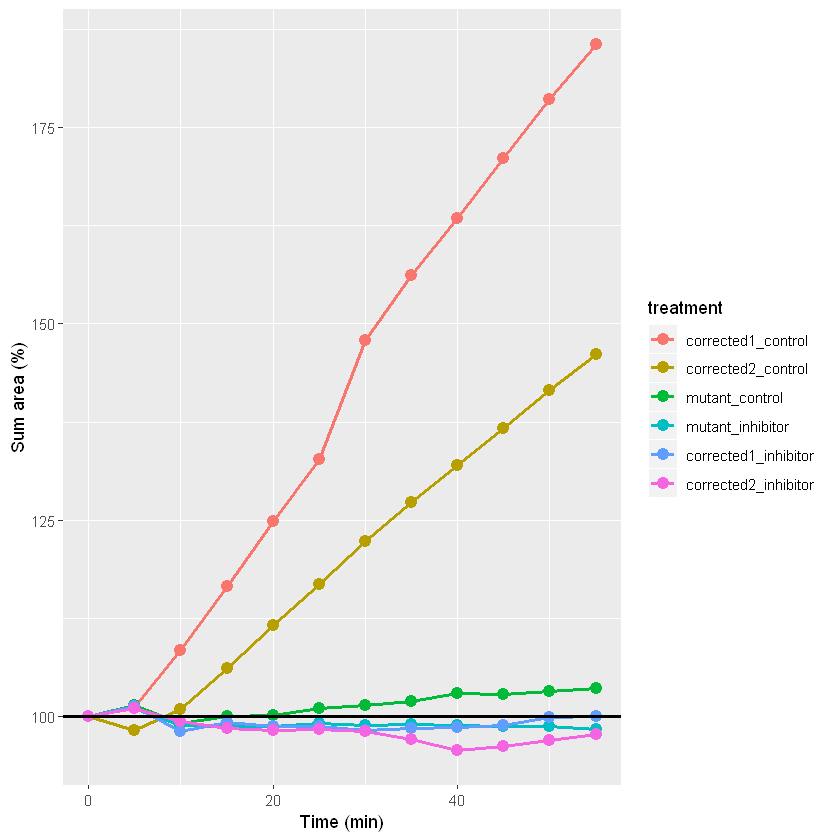

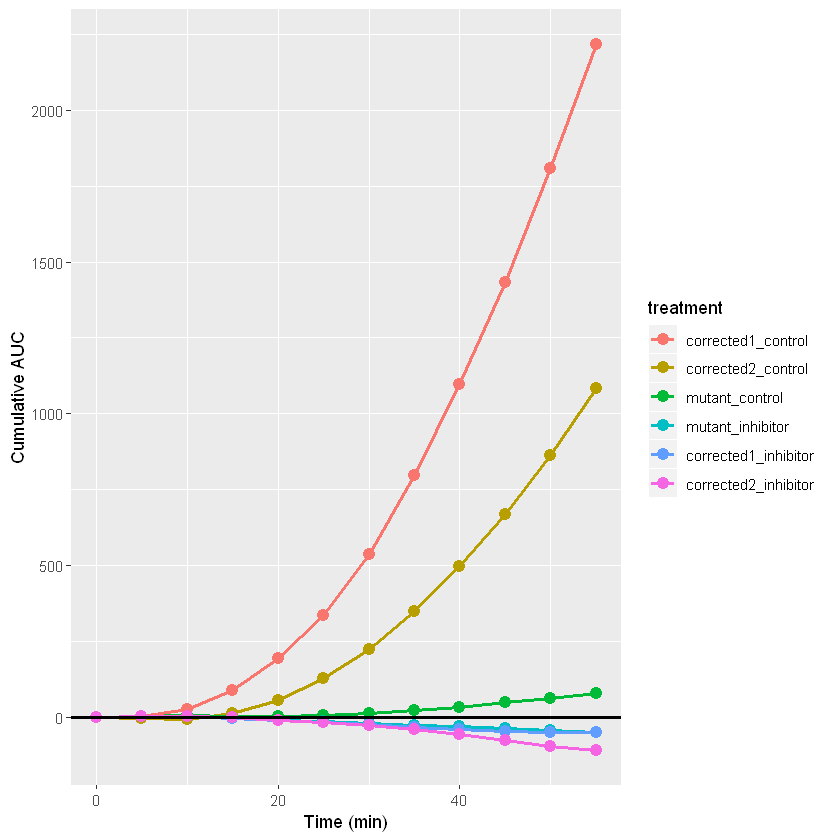

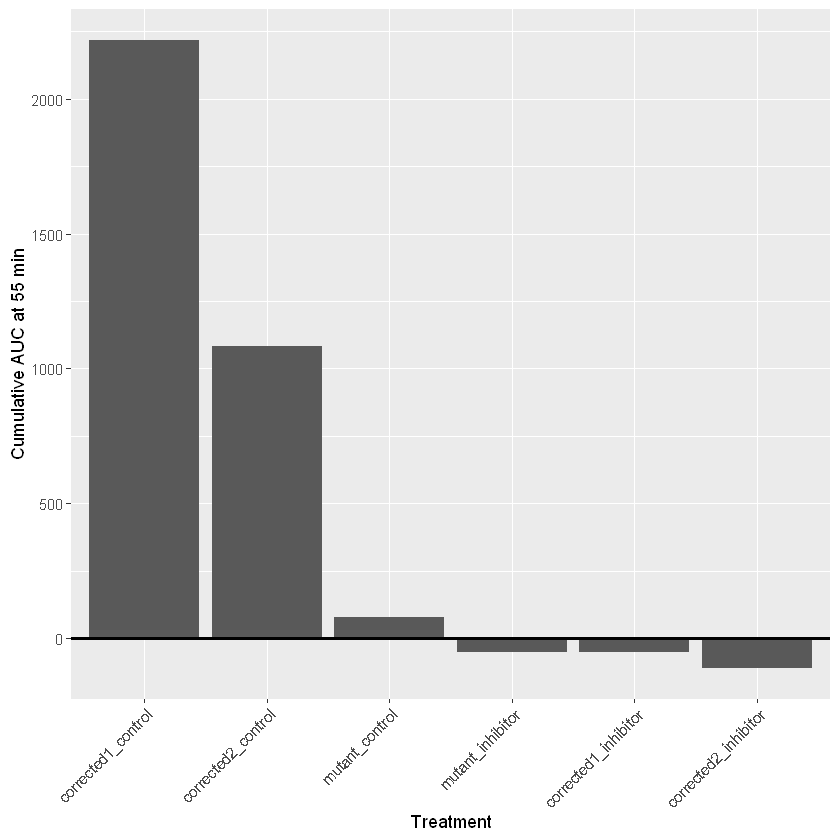

In [8]:
# Kinetics: % swelling
g1 <- ggplot(data = normdata, aes(minutes, normalized, color = treatment)) + 
      geom_line(size=1) + 
      geom_point(size=3) + 
      xlab ("Time (min)") +
      ylab ("Sum area (%)") + 
      geom_hline(yintercept = 100, size=1)

# Kinetics: AUC (area under the curve)
g2 <- ggplot(data = normdata, aes(minutes, AUC, color = treatment)) + 
      geom_line(size=1) + 
      geom_point(size=3) + 
      xlab ("Time (min)") +
      ylab ("Cumulative AUC") + 
      geom_hline(yintercept = 0, size=1)

## Kinetics: summary at 55 min
normdata55 <- subset(normdata, minutes == 55)
g3 <- ggplot(data = normdata55, aes(treatment, AUC)) + 
      geom_bar(stat="identity") +
      xlab ("Treatment") +
      ylab ("Cumulative AUC at 55 min") + 
      theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
      geom_hline(yintercept = 0, size=1)

g1
g2
g3

## <a name="interpretation">6. Results interpretation</a>

Clone #1 is the best at correcting the CFTR mutation, as it produces the most swelling. We can be sure that this clone is indeed correcting CFTR because the usage of a specific CFTR inhibitor completely inhibits swelling.